
# YOLOv11 Training Pipeline for Dental Cavity Detection Using Roboflow Dataset
This notebook provides a complete end-to-end workflow for training a YOLOv11 object detection model on a dental cavity dataset.
It includes dataset loading from Roboflow, YAML configuration generation, dataset inspection, model training with customized hyperparameters, validation, visualization of results, and sample inference on test images.
This structure ensures reproducibility, clarity, and ease of understanding.

In [1]:
# Install required libraries
!pip install ultralytics roboflow > /dev/null

Install & Load Dataset

Connect to Roboflow and download the dataset in YOLOv11 format

In [2]:
from roboflow import Roboflow

# Load dataset from Roboflow
rf = Roboflow(api_key="eG4cRZoQlvsn2Cm9Gj1C")
project = rf.workspace("duong-duc-cuong").project("cavity-n3ioq")
version = project.version(4)

# Download dataset in YOLOv11 format
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to cavity-4 in yolov11:: 100%|██████████| 1996/1996 [00:00<00:00, 2331.59it/s]


In [3]:
# Generate a data.yaml configuration file required for YOLOv11
# This file defines training paths, validation paths, and class names
import yaml

data = {
    "train": "/content/cavity-4/train/images",
    "val": "/content/cavity-4/valid/images",
    "names": ["cavity", "normal"],
    "nc": 2
}

with open("/content/cavity-4/data_safe.yaml", "w") as f:
    yaml.dump(data, f)

print("data_safe.yaml created successfully.")

data_safe.yaml created successfully.


In [4]:
# Display basic dataset statistics: total train and validation images
import glob

num_train = len(glob.glob("/content/cavity-4/train/images/*"))
num_val = len(glob.glob("/content/cavity-4/valid/images/*"))

print("Dataset Summary:")
print(f"Train images: {num_train}")
print(f"Validation images: {num_val}")


Dataset Summary:
Train images: 861
Validation images: 93


Train *YOLO11*

Train YOLOv11 with custom hyperparameters and augmentations so this section performs model optimization and learning

In [5]:
from ultralytics import YOLO

model = YOLO("yolo11s.pt")

# Model training
model.train(
    data="/content/cavity-4/data_safe.yaml",
    epochs=90,
    imgsz=1024,
    batch=16,
    device=0,

    # Class weights (Higher weight for cavity since it is the minority class)
    cls=1.2,
    box=1.0,
    dfl=1.0,

    # Safe augmentation (improves generalization without harming accuracy)
    hsv_h=0.012,
    hsv_s=0.45,
    hsv_v=0.45,
    fliplr=0.20,
    scale=0.20,
    shear=0.5,
    translate=0.08,
    perspective=0.0003,

    dropout=0.02,
    mixup=0.05,
    mosaic=0.20,

    # Optimizer setup
    optimizer="AdamW",
    lr0=0.0025,
    lrf=0.02,
    weight_decay=0.0004,

    patience=40,
    workers=2,
    verbose=True,
    plots=True
)

#Validate Model Performance to generate evaluation metrics
results = model.val()
results

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=1.0, cache=False, cfg=None, classes=None, close_mosaic=10, cls=1.2, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/cavity-4/data_safe.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.0, dnn=False, dropout=0.02, dynamic=False, embed=None, epochs=90, erasing=0.4, exist_ok=False, fliplr=0.2, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.012, hsv_s=0.45, hsv_v=0.45, imgsz=1024, int8=False, iou=0.7, ke

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b16bfe260f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

# Display Confusion Matrix

Confusion Matrix:


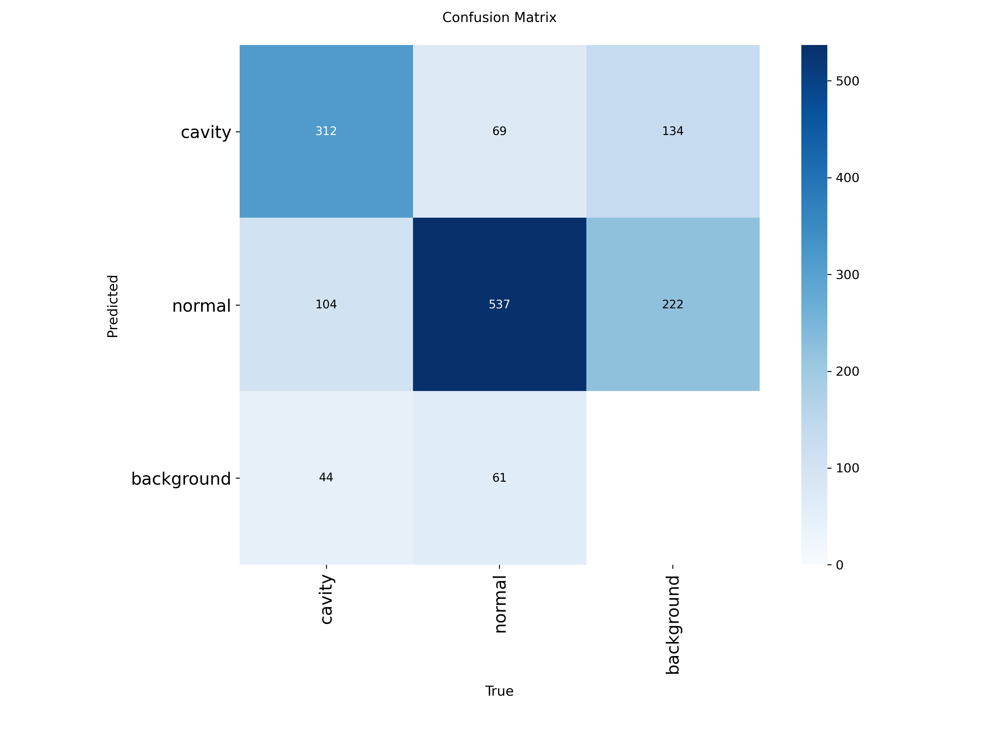

In [6]:
# Display the confusion matrix generated during model validation
from IPython.display import Image, display
import os

cm_path = "/content/runs/detect/train/confusion_matrix.png"

print("Confusion Matrix:")

if os.path.exists(cm_path):
    display(Image(filename=cm_path))
else:
    print("confusion_matrix.png not found.")


# Display Training Curves

Visualize Training Result Images

Found 17 result images.
Displaying: /content/runs/detect/train/BoxF1_curve.png


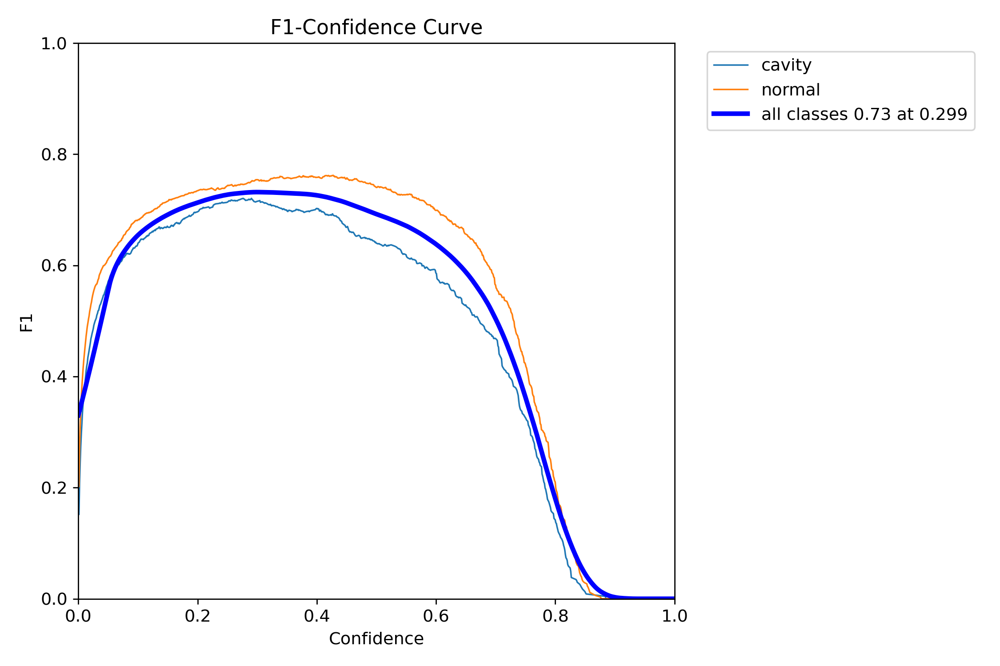

Displaying: /content/runs/detect/train/confusion_matrix.png


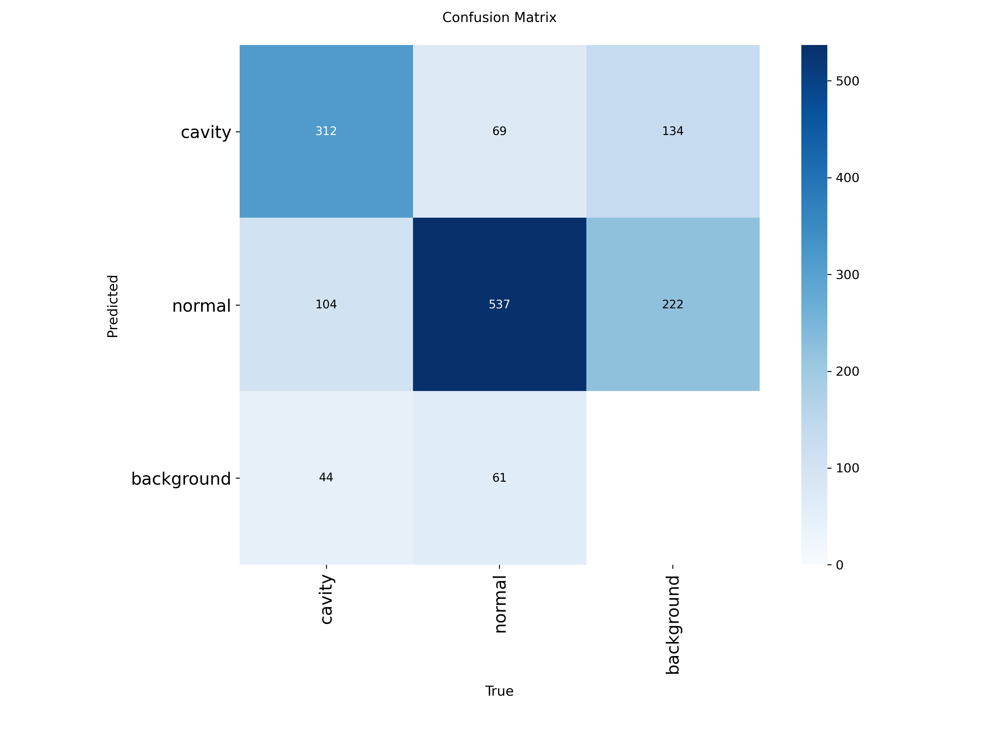

Displaying: /content/runs/detect/train/BoxPR_curve.png


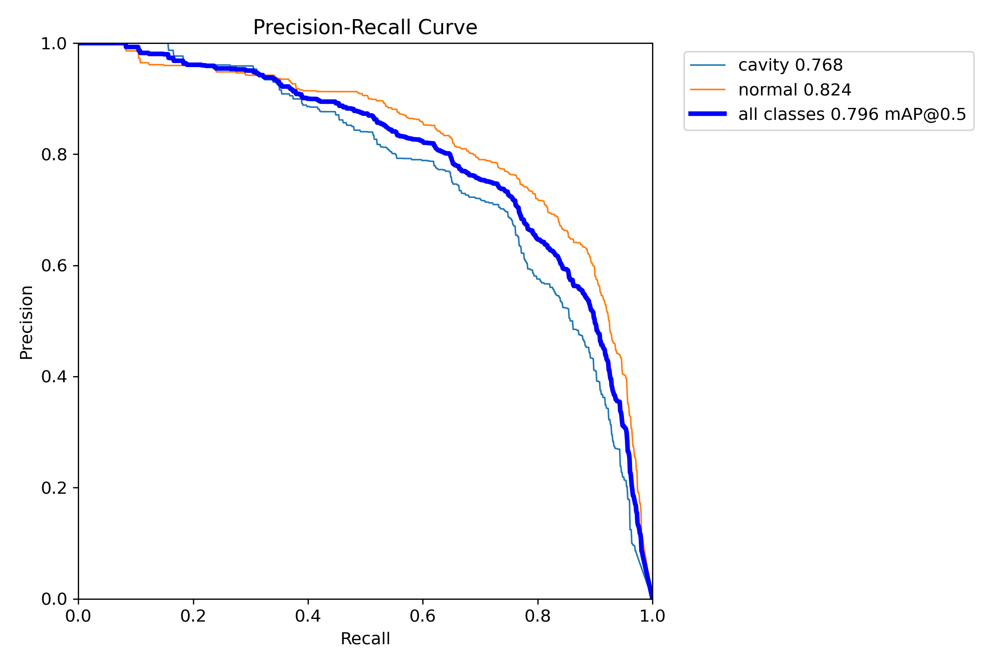

Displaying: /content/runs/detect/train/BoxR_curve.png


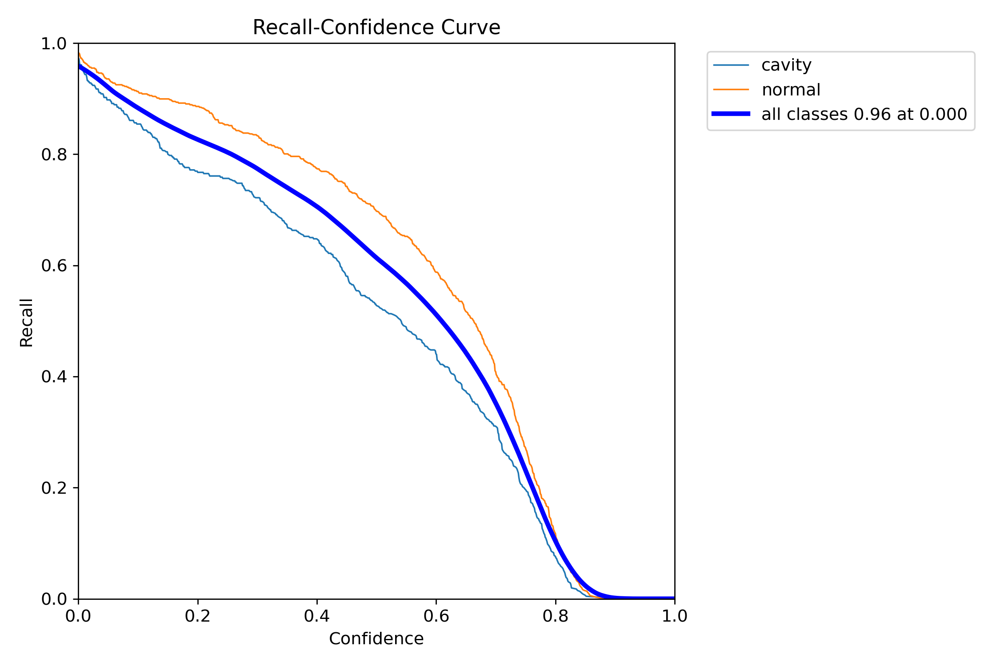

Displaying: /content/runs/detect/train/BoxP_curve.png


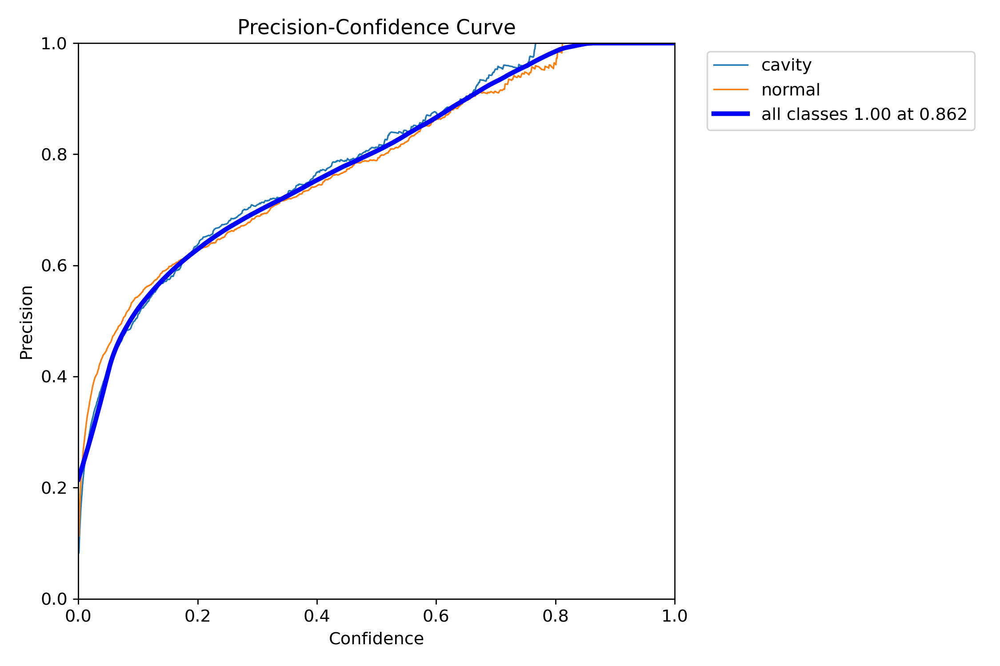

Displaying: /content/runs/detect/train/results.png


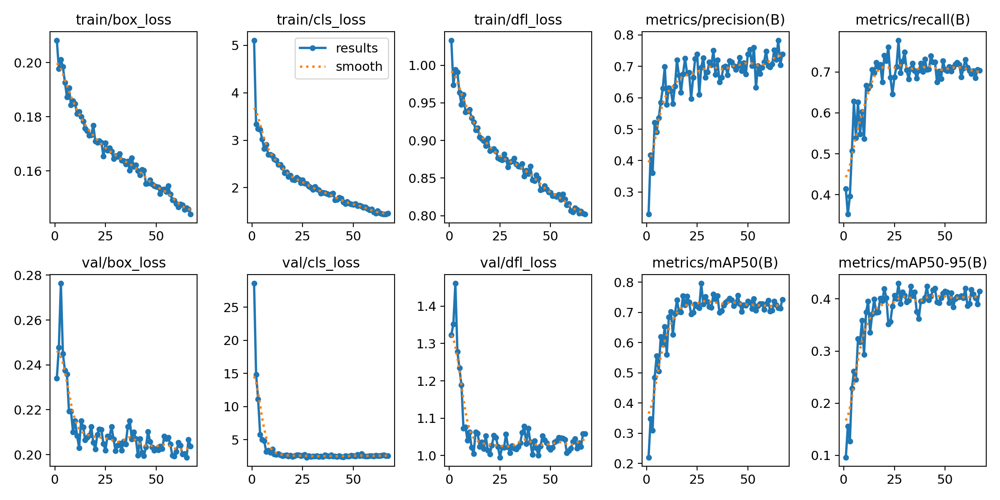

Displaying: /content/runs/detect/train/confusion_matrix_normalized.png


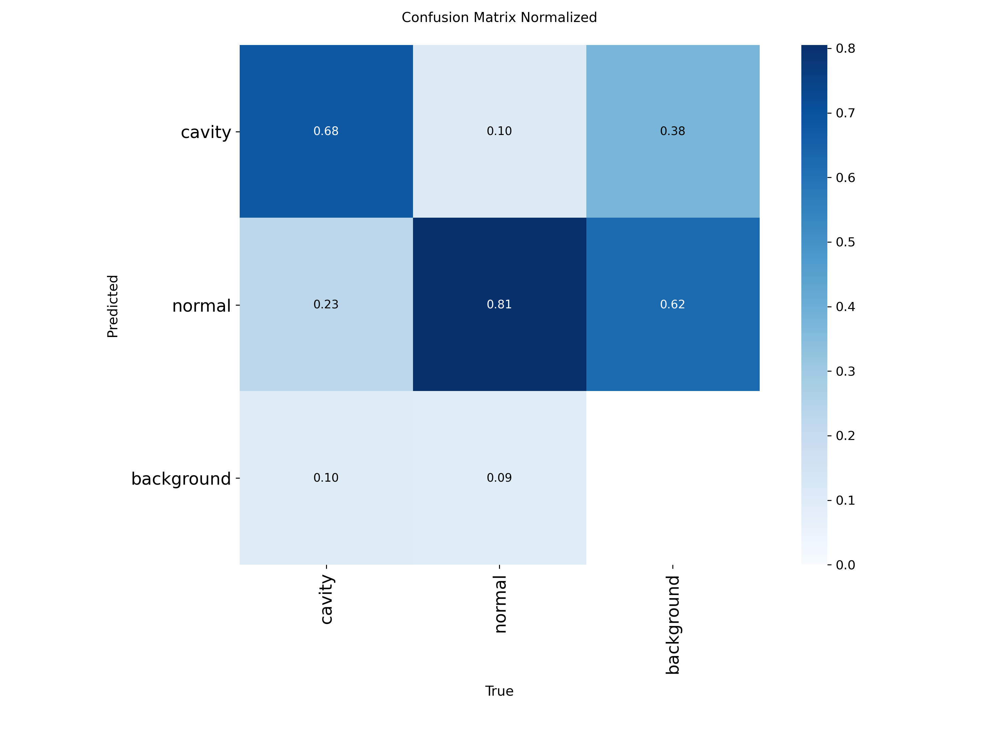

Displaying: /content/runs/detect/train/val_batch1_labels.jpg


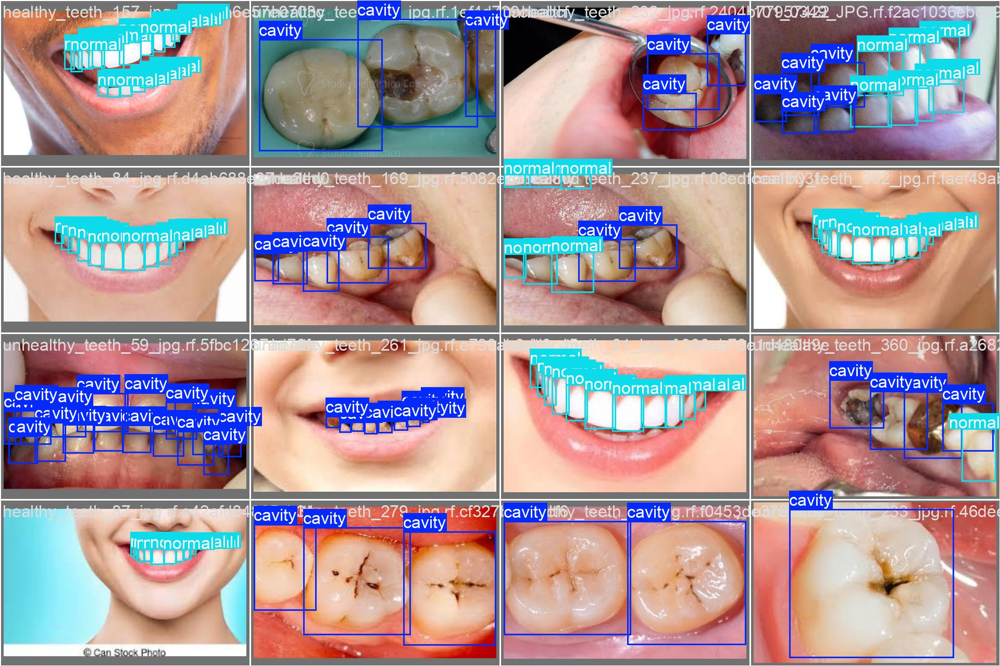

Displaying: /content/runs/detect/train/val_batch0_labels.jpg


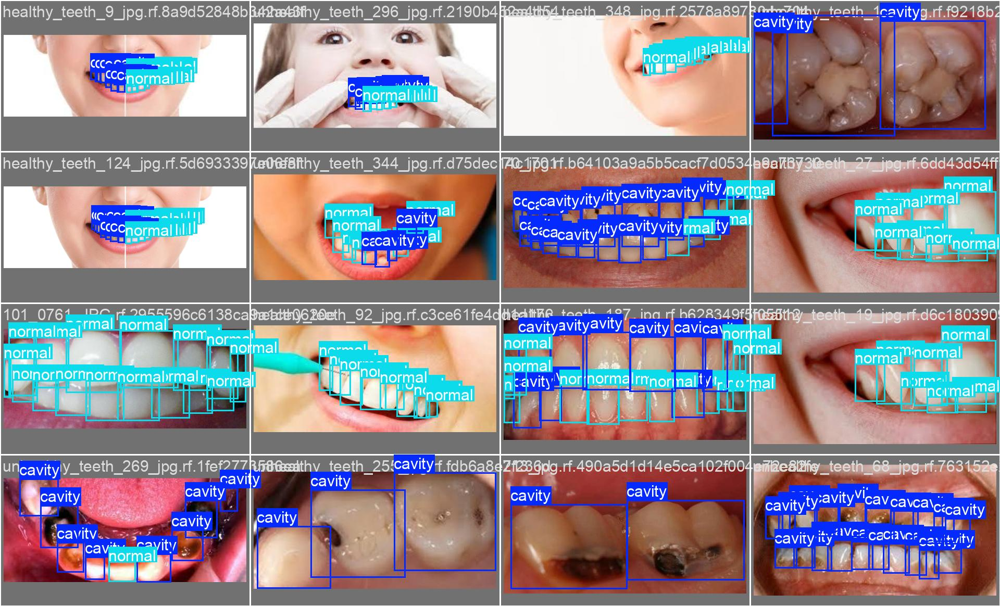

Displaying: /content/runs/detect/train/train_batch2.jpg


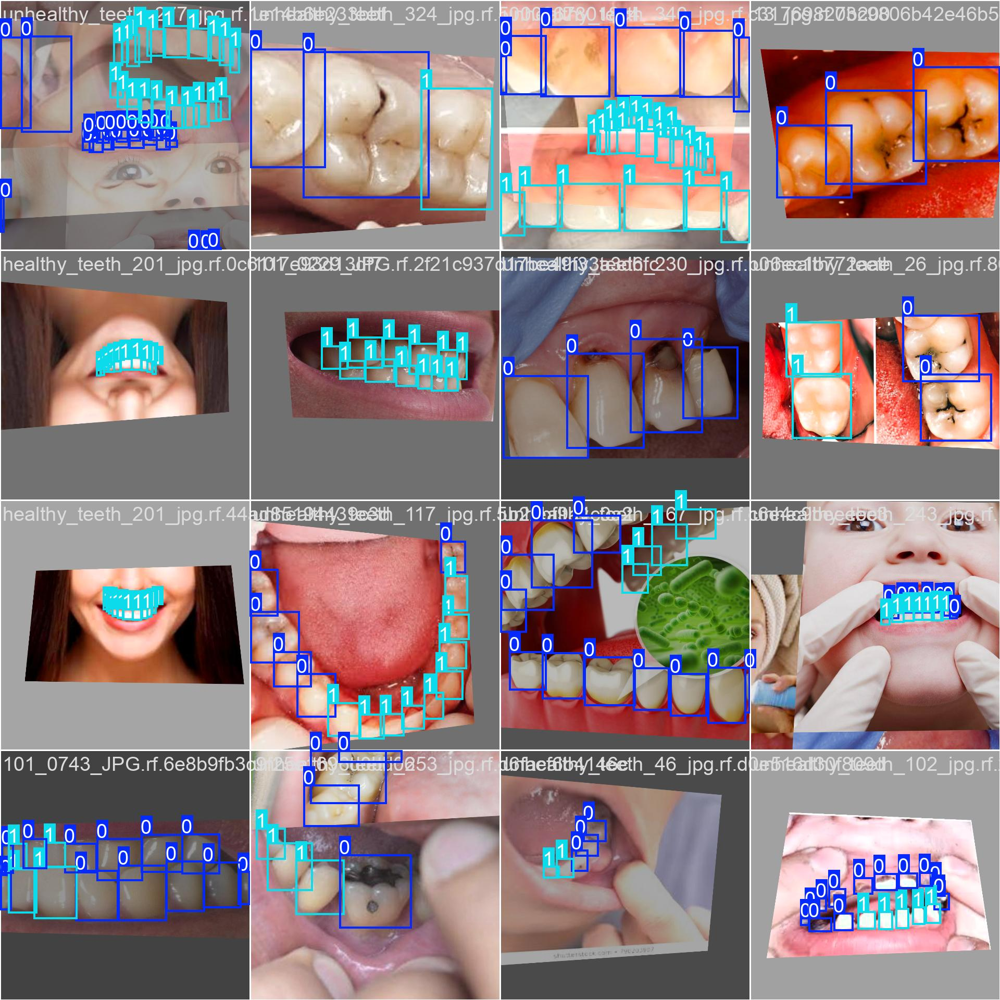

Displaying: /content/runs/detect/train/val_batch2_pred.jpg


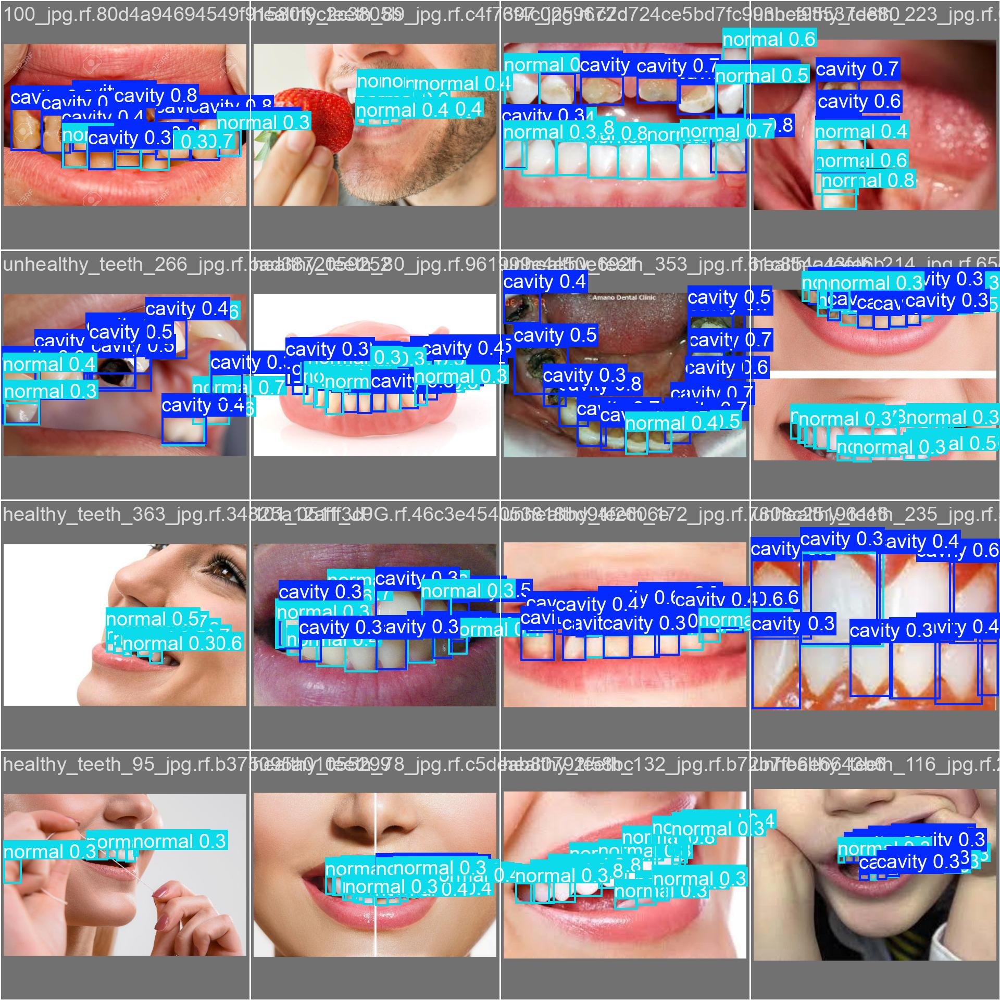

Displaying: /content/runs/detect/train/labels.jpg


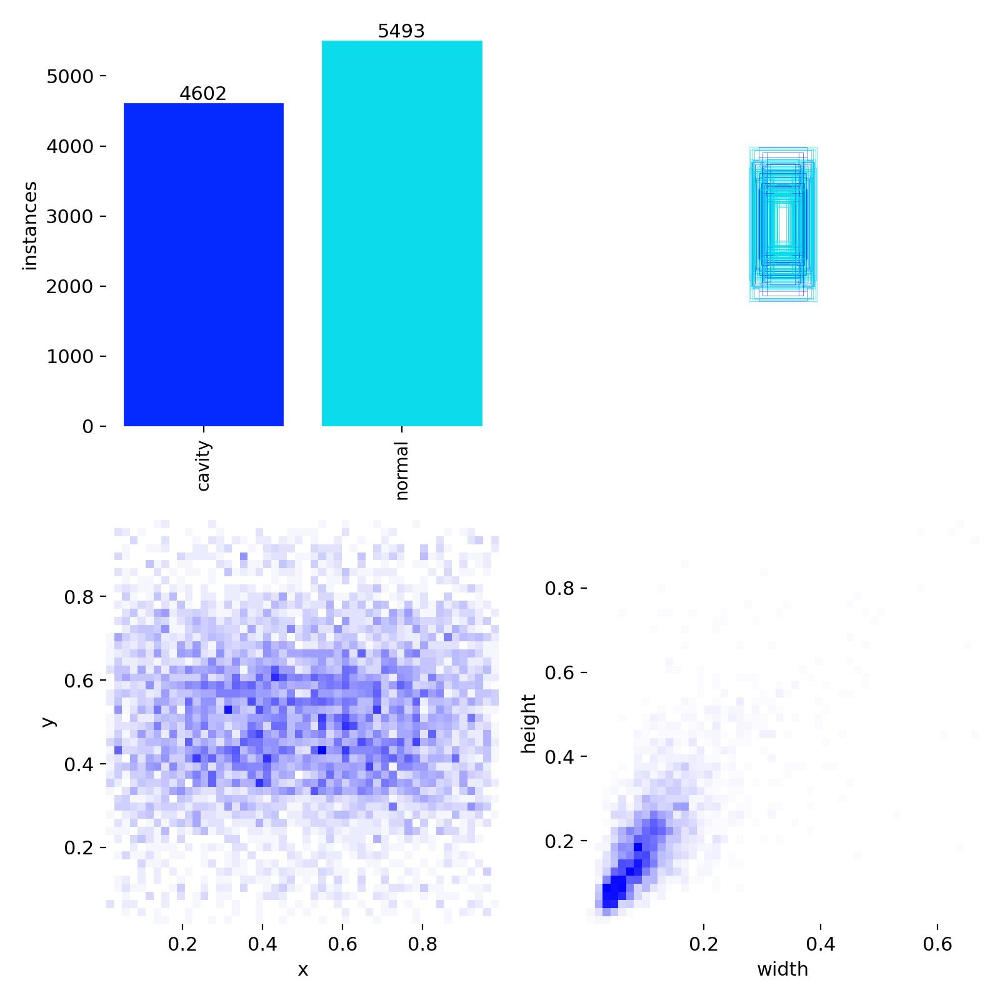

Displaying: /content/runs/detect/train/train_batch0.jpg


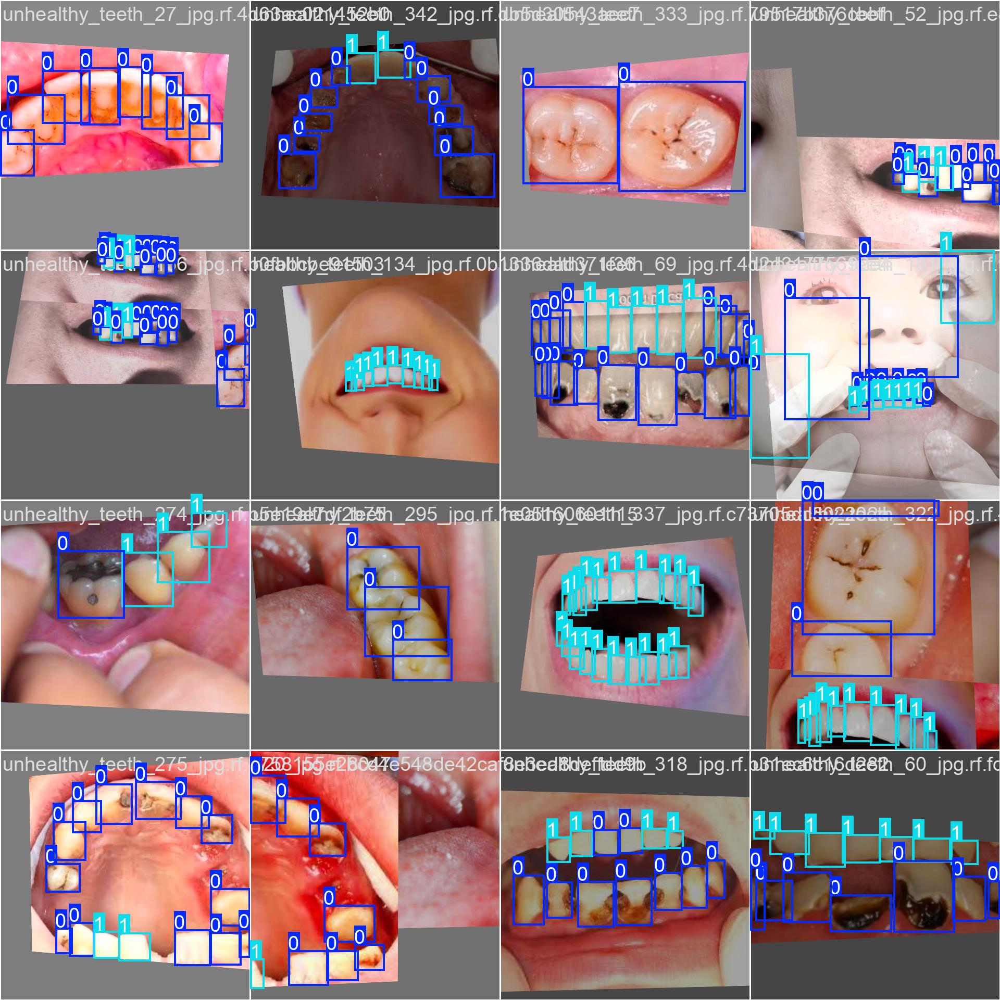

Displaying: /content/runs/detect/train/val_batch2_labels.jpg


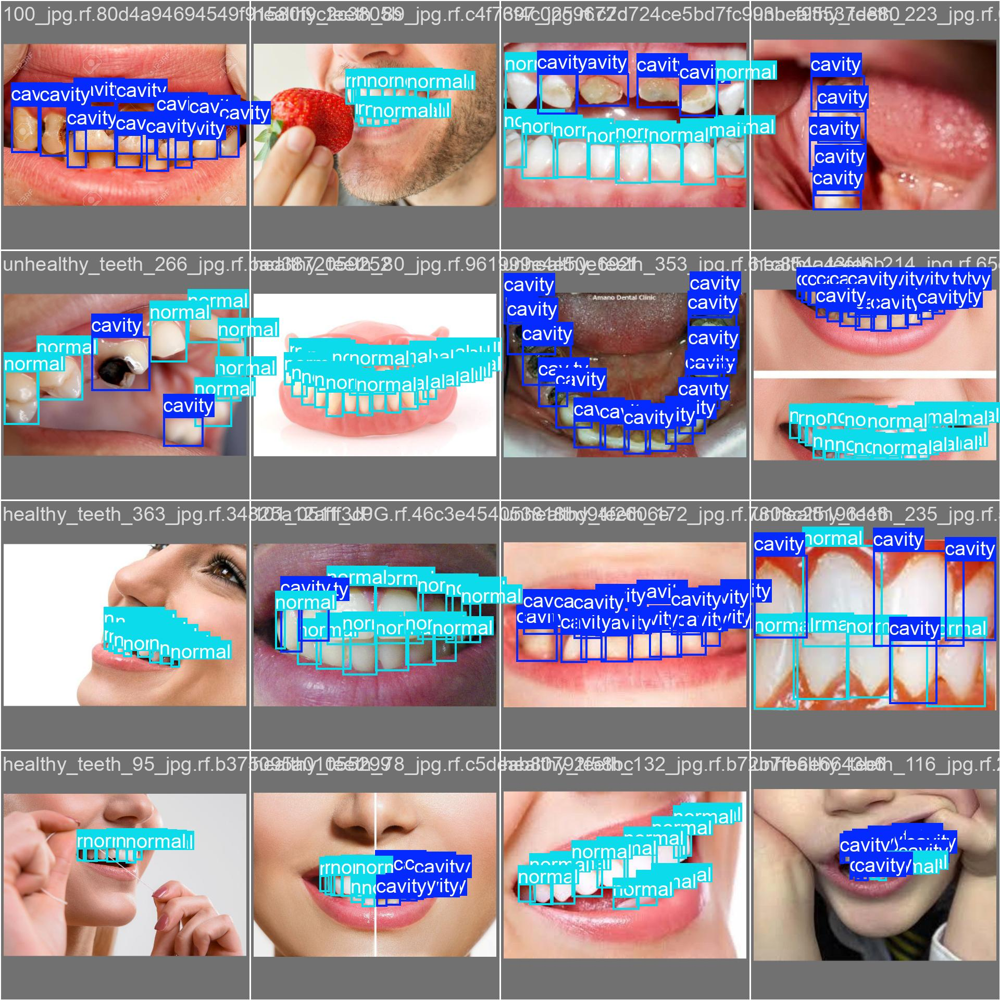

Displaying: /content/runs/detect/train/val_batch0_pred.jpg


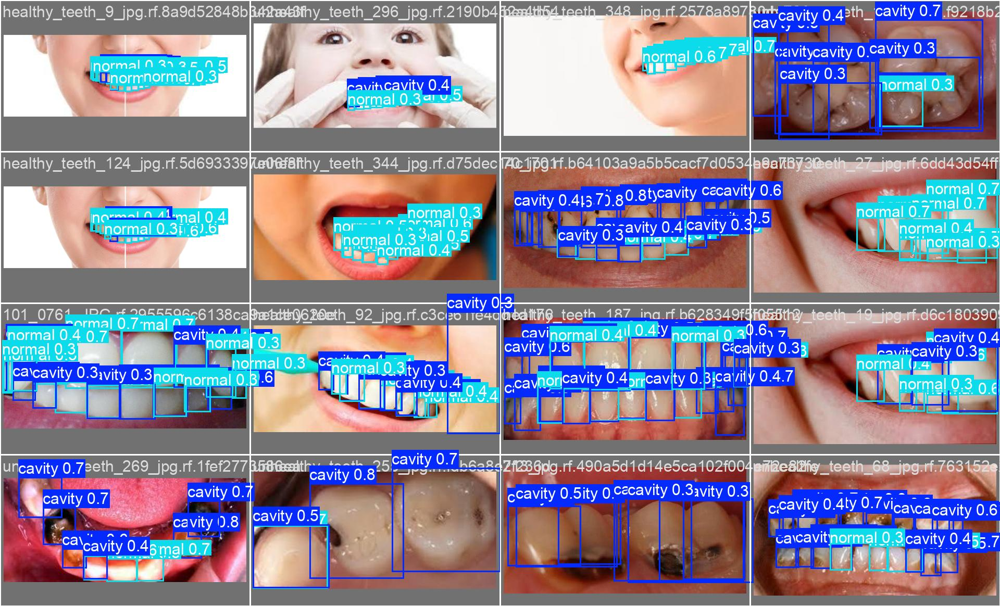

Displaying: /content/runs/detect/train/train_batch1.jpg


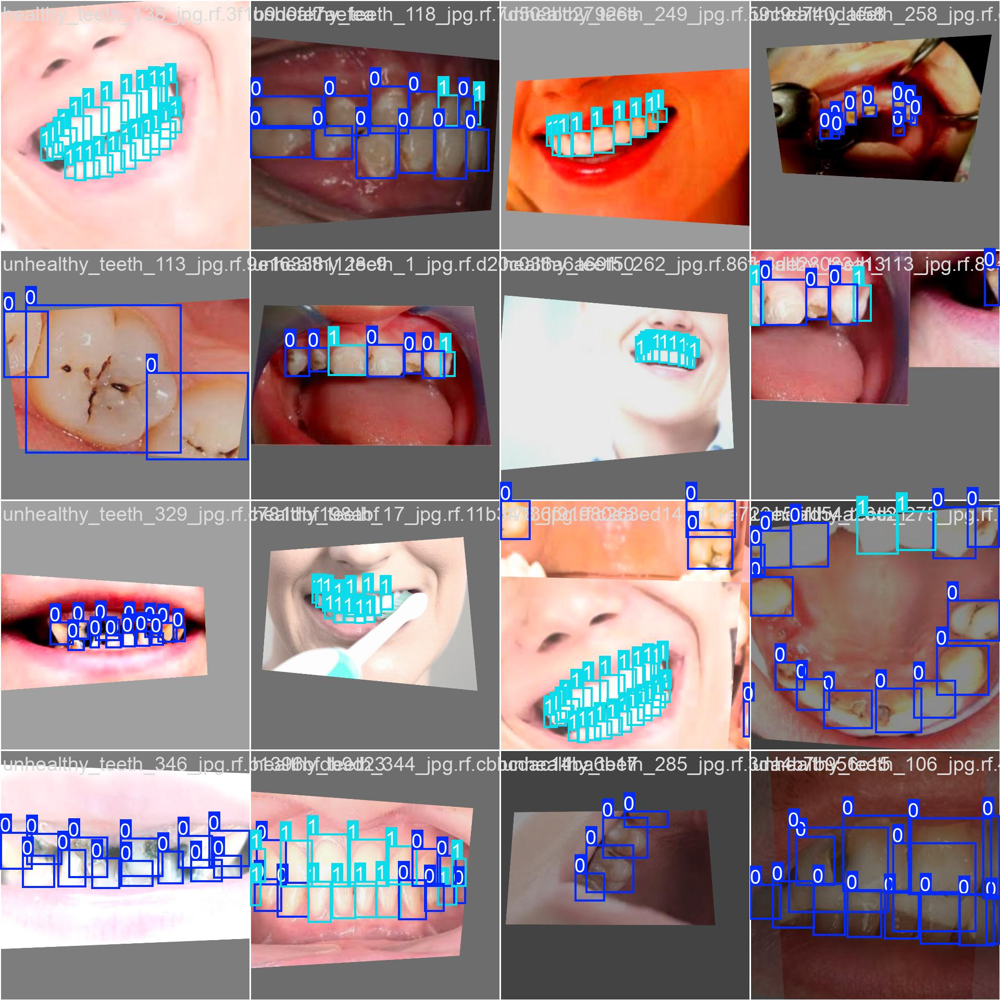

Displaying: /content/runs/detect/train/val_batch1_pred.jpg


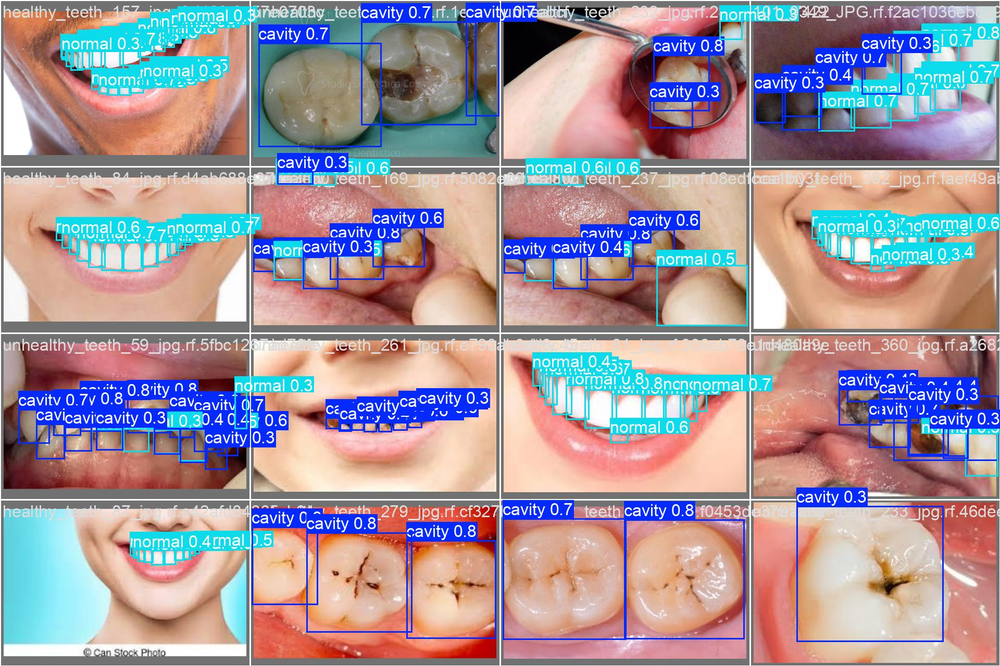

In [7]:
import glob
from IPython.display import Image, display

result_images = glob.glob("/content/runs/detect/train/*.png") + \
                glob.glob("/content/runs/detect/train/*.jpg")

print(f"Found {len(result_images)} result images.")

for img_path in result_images:
    print(f"Displaying: {img_path}")
    display(Image(filename=img_path))


# Visualize Model Predictions on Validation Set

Sample predictions on validation images:


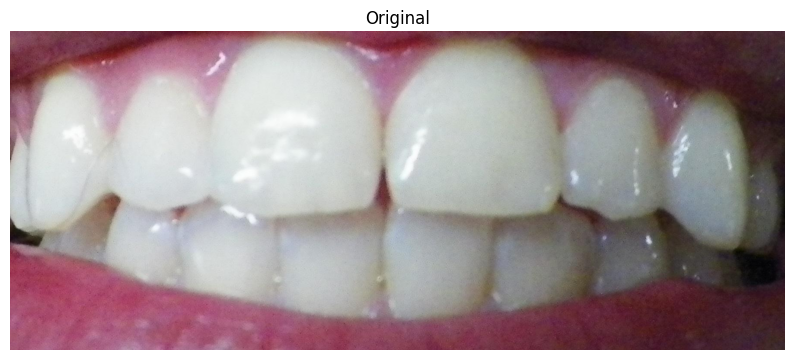


image 1/1 /content/cavity-4/valid/images/101_0761_JPG.rf.2955596c6138ca9a1ce0620e59e86ed7.jpg: 448x1024 7 cavitys, 16 normals, 18.1ms
Speed: 5.1ms preprocess, 18.1ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 1024)
Results saved to /content/runs/detect/predict


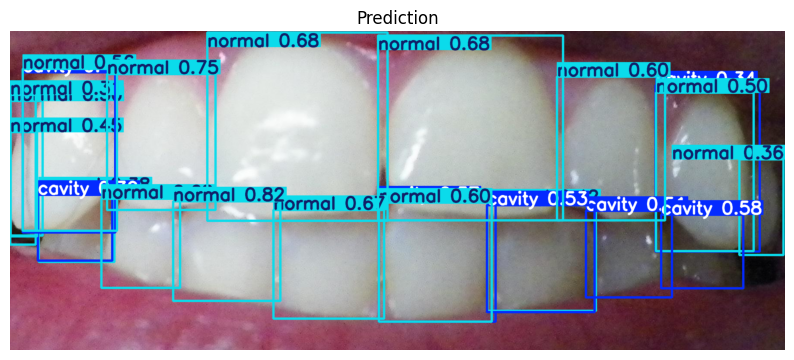

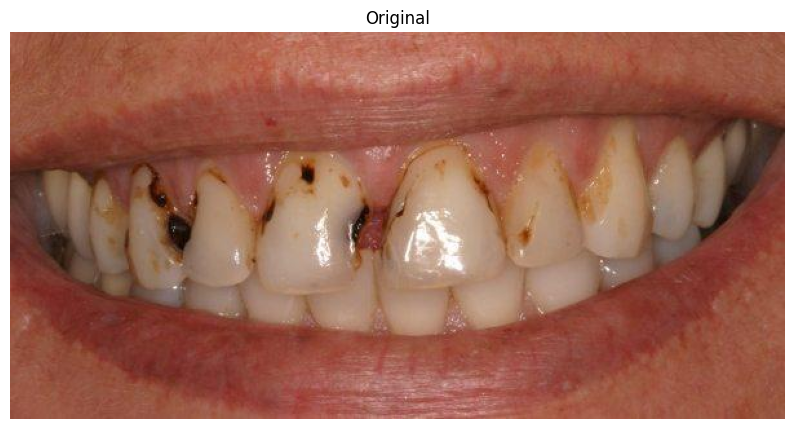


image 1/1 /content/cavity-4/valid/images/70_jpg.rf.b64103a9a5b5cacf7d0534e9c7373012.jpg: 512x1024 15 cavitys, 7 normals, 19.5ms
Speed: 4.2ms preprocess, 19.5ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 1024)
Results saved to /content/runs/detect/predict


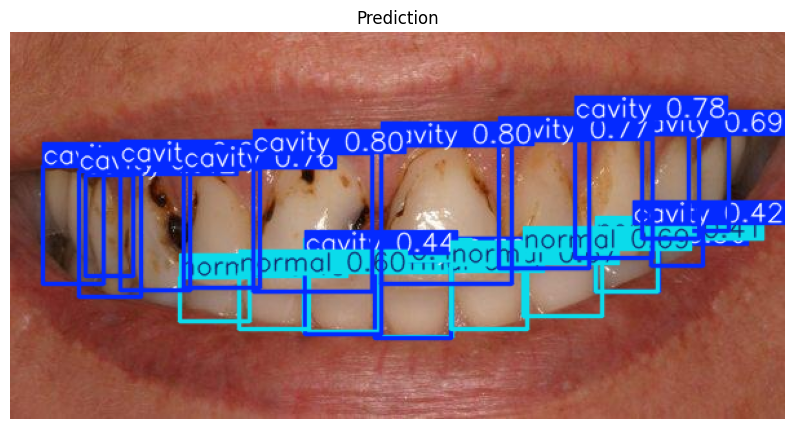

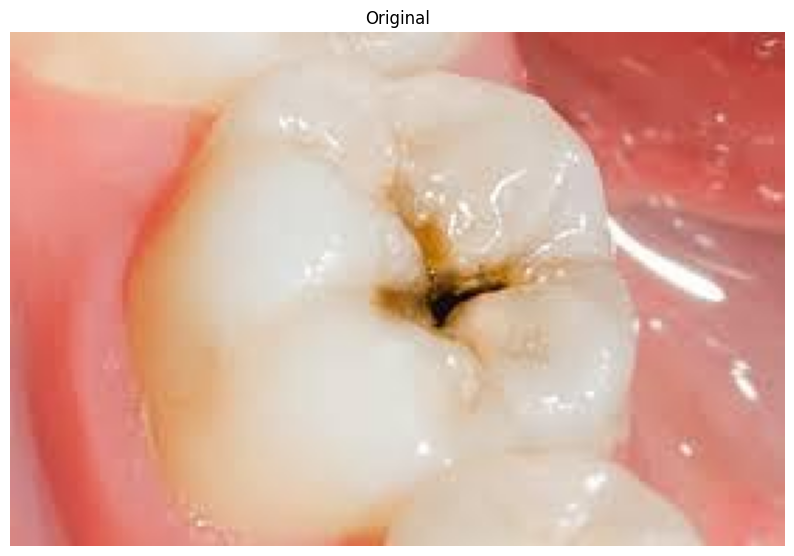


image 1/1 /content/cavity-4/valid/images/unhealthy_teeth_233_jpg.rf.46deefc3cb72590f268b3fd66cf3c56a.jpg: 704x1024 1 cavity, 26.4ms
Speed: 5.8ms preprocess, 26.4ms inference, 1.6ms postprocess per image at shape (1, 3, 704, 1024)
Results saved to /content/runs/detect/predict


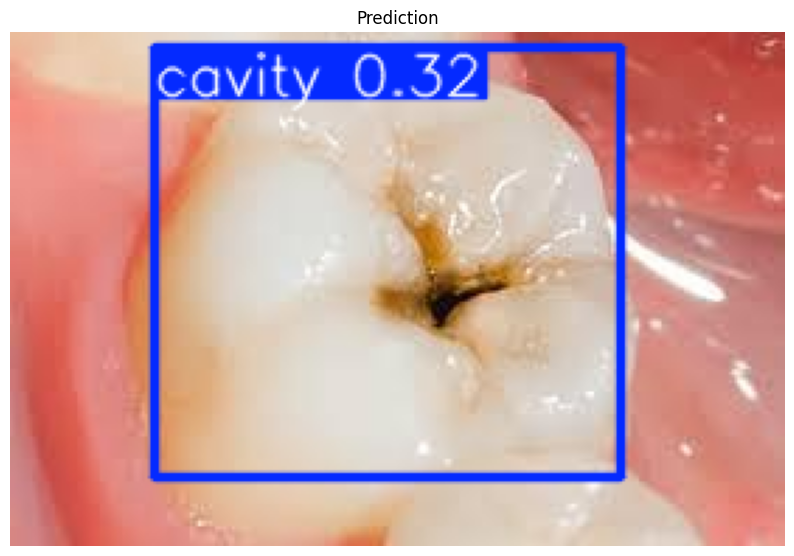

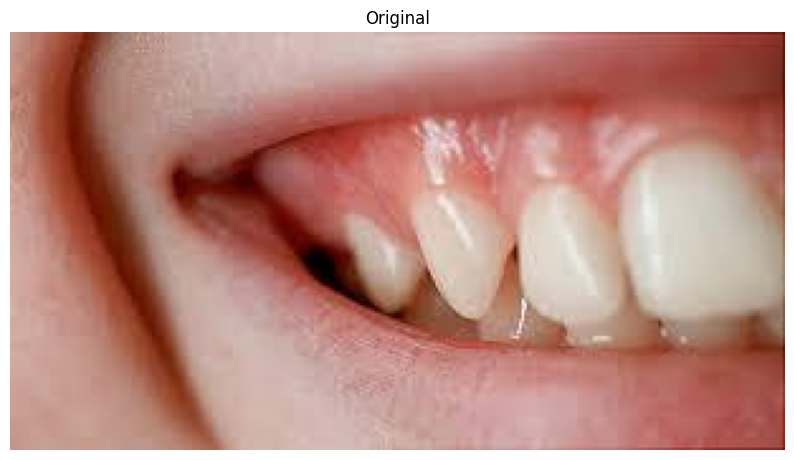


image 1/1 /content/cavity-4/valid/images/healthy_teeth_19_jpg.rf.d6c18039094c4fee00848233303a835d.jpg: 576x1024 7 normals, 21.0ms
Speed: 4.4ms preprocess, 21.0ms inference, 1.5ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to /content/runs/detect/predict


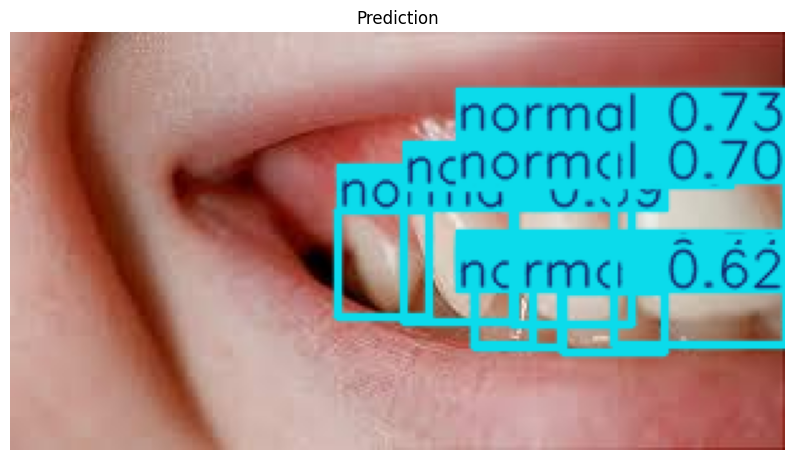

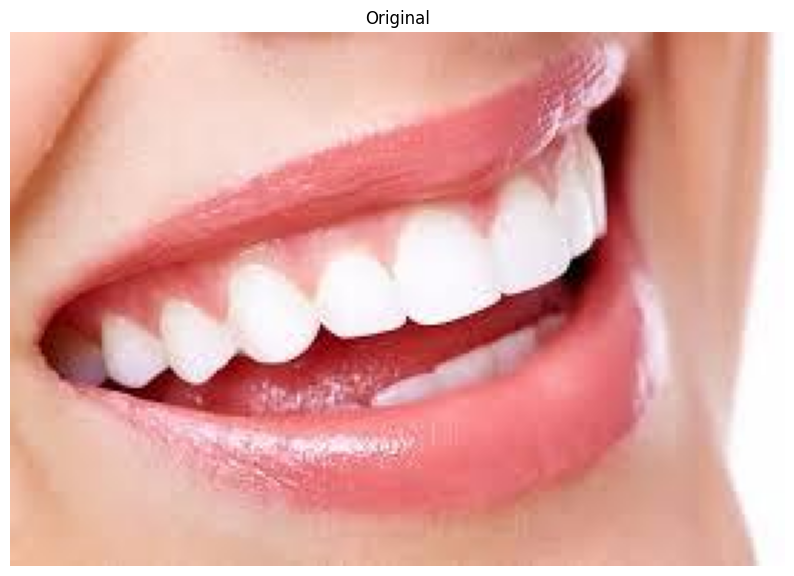


image 1/1 /content/cavity-4/valid/images/healthy_teeth_132_jpg.rf.b72b7fb6e6643b6a5f06c64eff72c00c.jpg: 736x1024 13 normals, 26.7ms
Speed: 4.9ms preprocess, 26.7ms inference, 1.6ms postprocess per image at shape (1, 3, 736, 1024)
Results saved to /content/runs/detect/predict


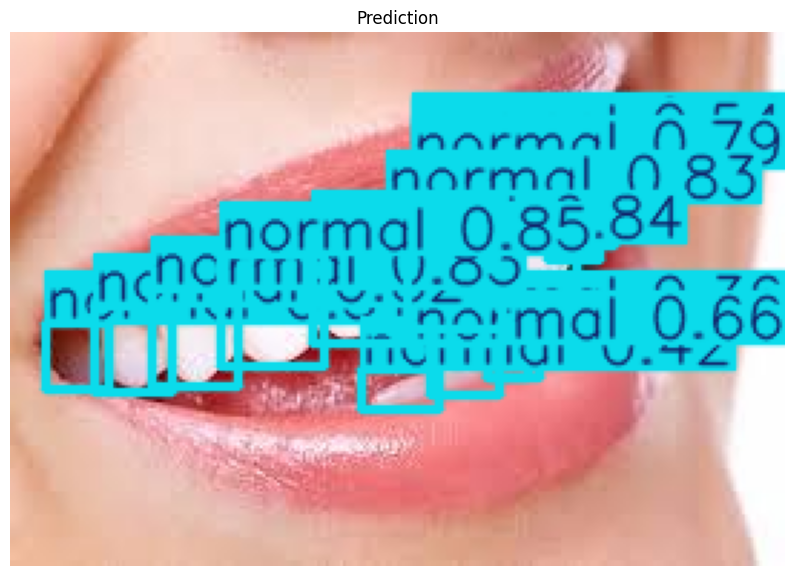

In [12]:
# Perform inference on a few validation images to preview predictions
import glob
from IPython.display import Image, display

val_imgs = glob.glob("/content/cavity-4/valid/images/*.jpg")[:5]

print("Sample predictions on validation images:")


for img in val_imgs:
    # plot original image
    orig_img = cv2.imread(img)
    orig_rgb = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 8))
    plt.imshow(orig_rgb)
    plt.axis("off")
    plt.title("Original")
    plt.show()

    # Run prediction
    pred = model.predict(source=img, conf=0.30, save=True)

    # Convert prediction tensor to plotted image
    predicted_image = pred[0].plot()

    # Convert BGR → RGB for matplotlib
    img_rgb = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)

    # Display
    plt.figure(figsize=(10, 8))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title("Prediction")
    plt.show()


Sample Predictions on Test Images (Visualization)

Found test images: 10


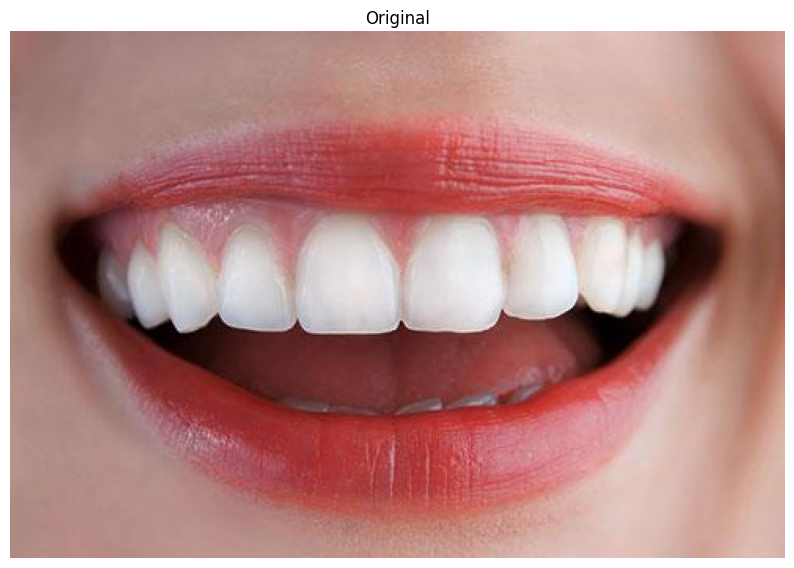


image 1/1 /content/cavity-4/test/images/healthy_teeth_402_jpg.rf.e18c234aae440f604d77868a8625b911.jpg: 704x1024 10 normals, 25.5ms
Speed: 9.7ms preprocess, 25.5ms inference, 1.9ms postprocess per image at shape (1, 3, 704, 1024)
Results saved to /content/runs/detect/predict


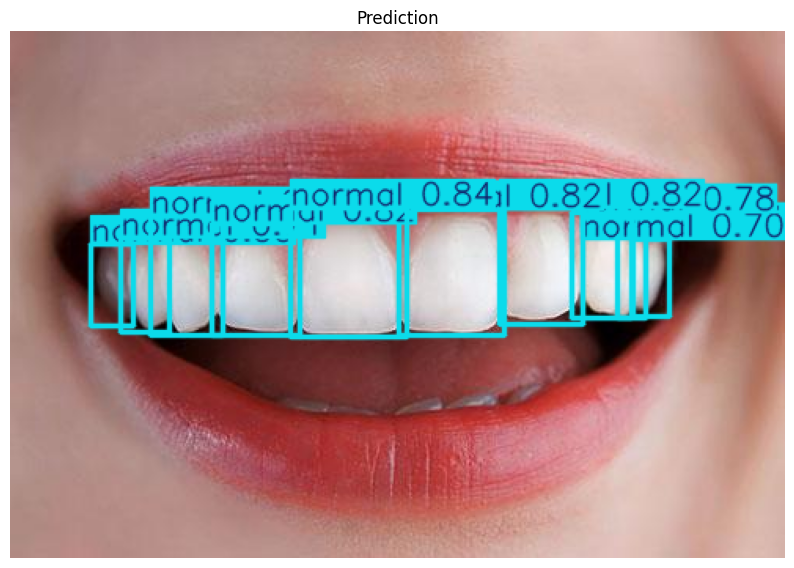

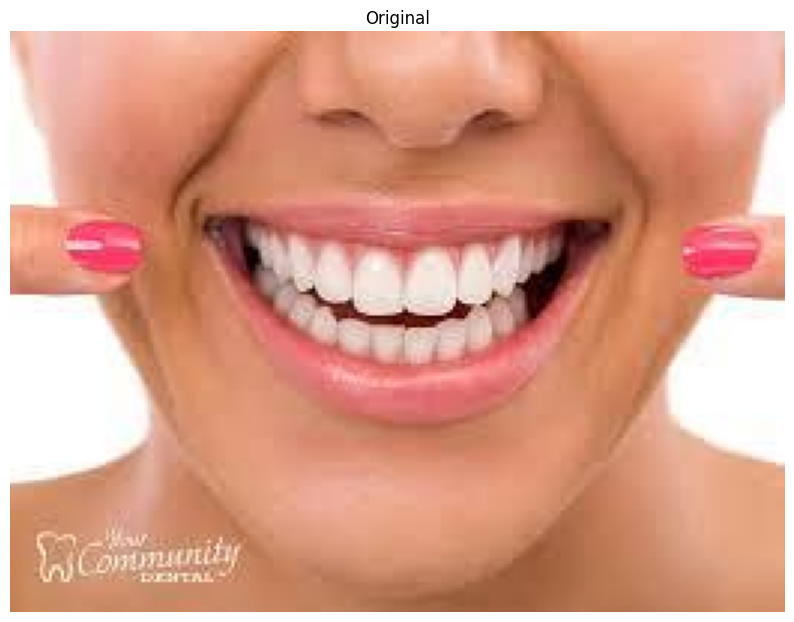


image 1/1 /content/cavity-4/test/images/healthy_teeth_46_jpg.rf.9168ede6d0a796c7205e9375abfb3b71.jpg: 768x1024 24 normals, 27.1ms
Speed: 5.6ms preprocess, 27.1ms inference, 2.2ms postprocess per image at shape (1, 3, 768, 1024)
Results saved to /content/runs/detect/predict


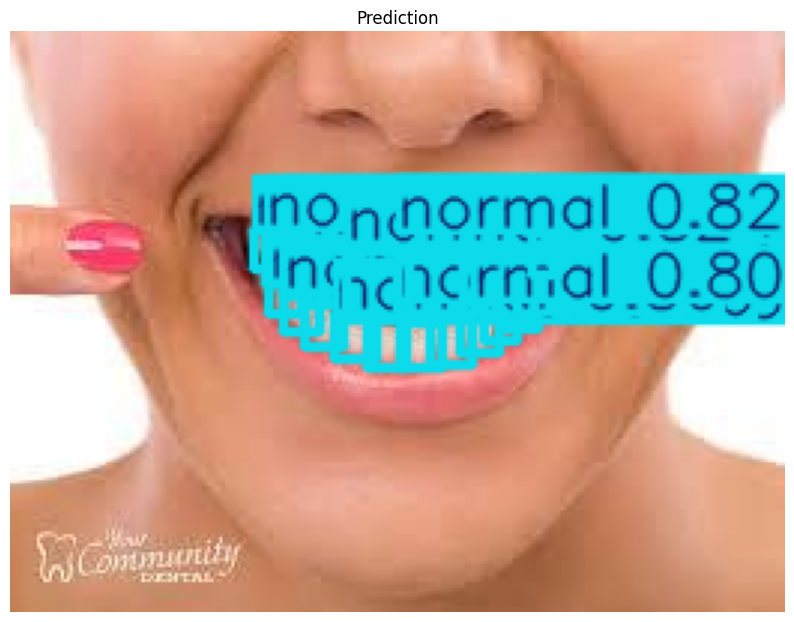

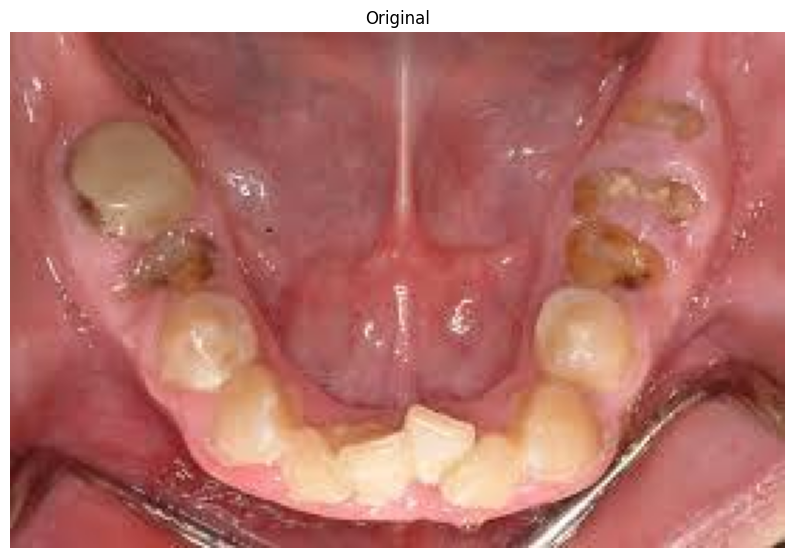


image 1/1 /content/cavity-4/test/images/unhealthy_teeth_208_jpg.rf.4b078b50d1e47625cfe6d7a2768269b5.jpg: 704x1024 8 cavitys, 3 normals, 26.2ms
Speed: 4.6ms preprocess, 26.2ms inference, 1.8ms postprocess per image at shape (1, 3, 704, 1024)
Results saved to /content/runs/detect/predict


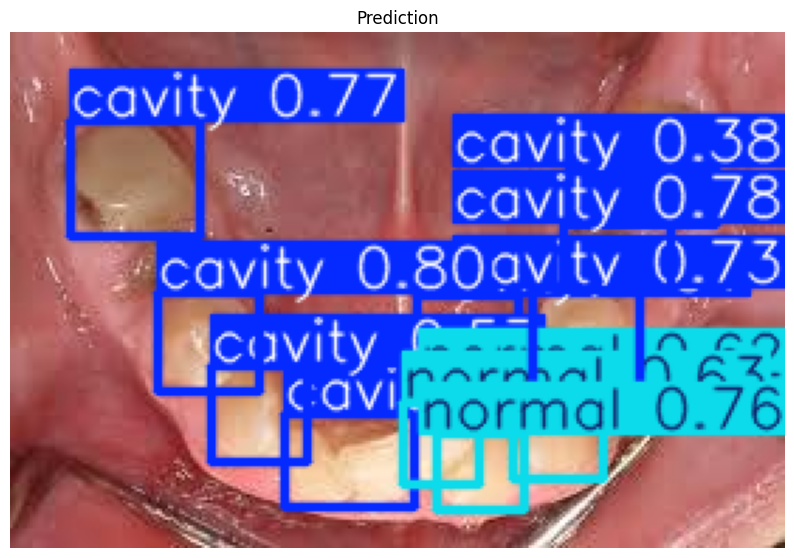

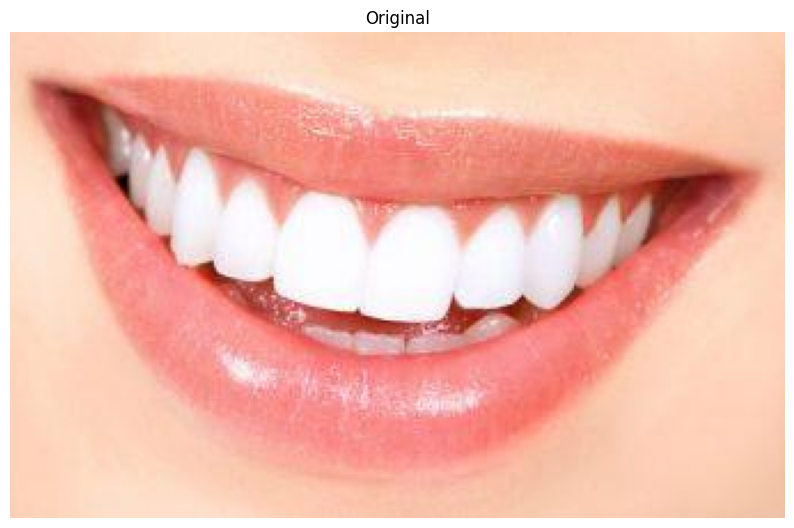


image 1/1 /content/cavity-4/test/images/healthy_teeth_406_jpg.rf.af1741117c1b35504f8c967ef35f48eb.jpg: 672x1024 13 normals, 25.9ms
Speed: 4.8ms preprocess, 25.9ms inference, 1.7ms postprocess per image at shape (1, 3, 672, 1024)
Results saved to /content/runs/detect/predict


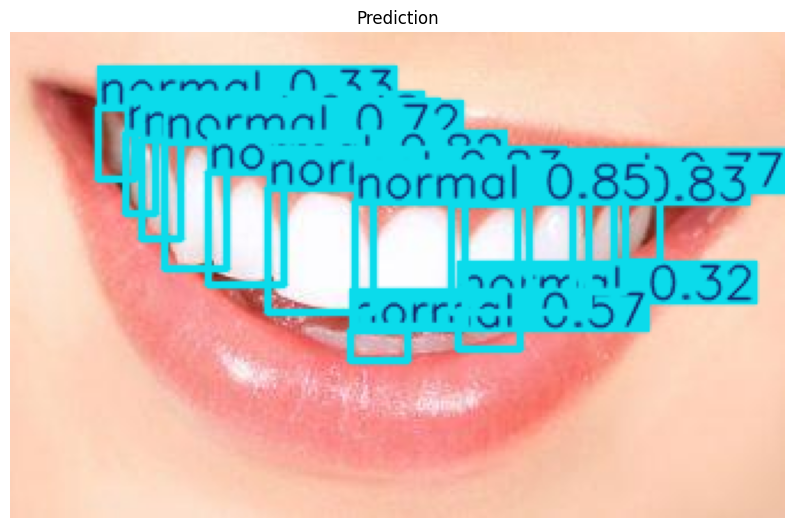

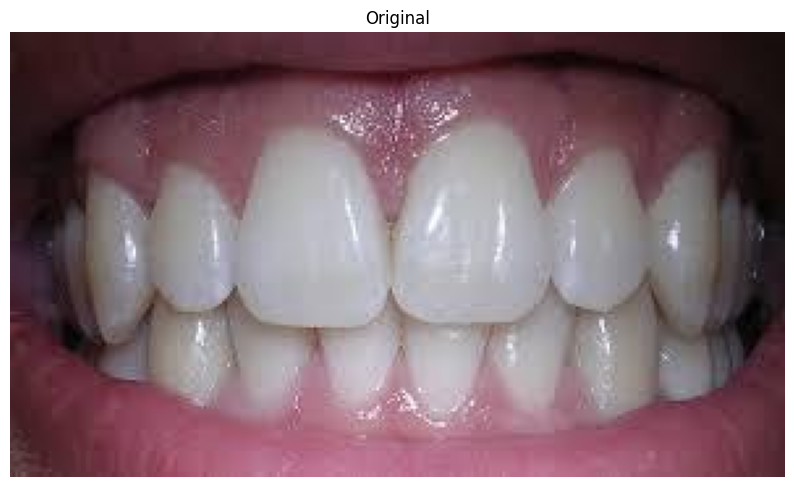


image 1/1 /content/cavity-4/test/images/healthy_teeth_61_jpg.rf.a813ce3a4c28e8244638de8311d06321.jpg: 608x1024 3 cavitys, 19 normals, 20.8ms
Speed: 4.7ms preprocess, 20.8ms inference, 1.7ms postprocess per image at shape (1, 3, 608, 1024)
Results saved to /content/runs/detect/predict


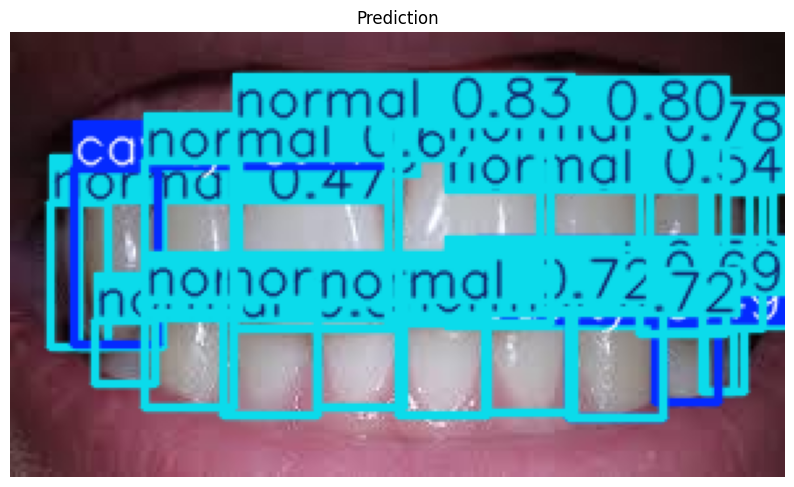

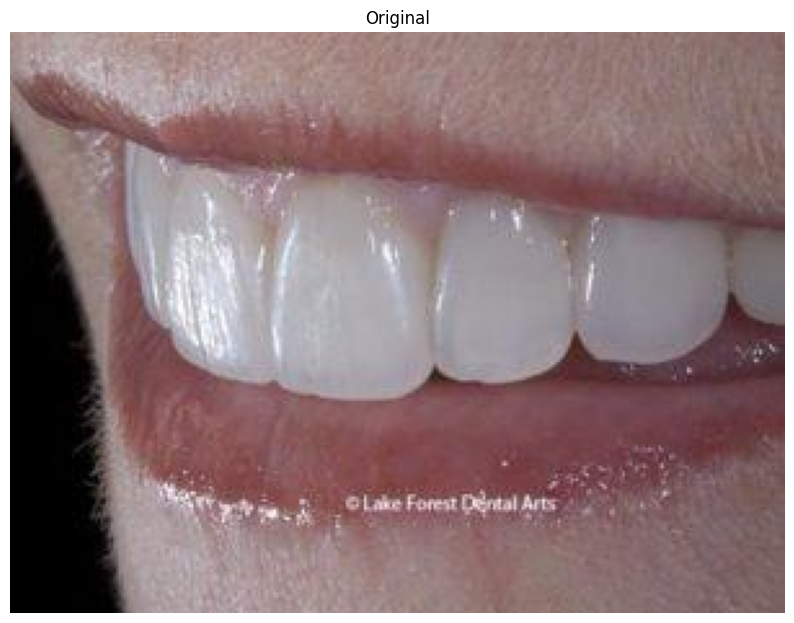


image 1/1 /content/cavity-4/test/images/healthy_teeth_62_jpg.rf.6a4d6e04a29f34b014ddc42da18f5b83.jpg: 768x1024 1 cavity, 5 normals, 27.1ms
Speed: 5.4ms preprocess, 27.1ms inference, 2.7ms postprocess per image at shape (1, 3, 768, 1024)
Results saved to /content/runs/detect/predict


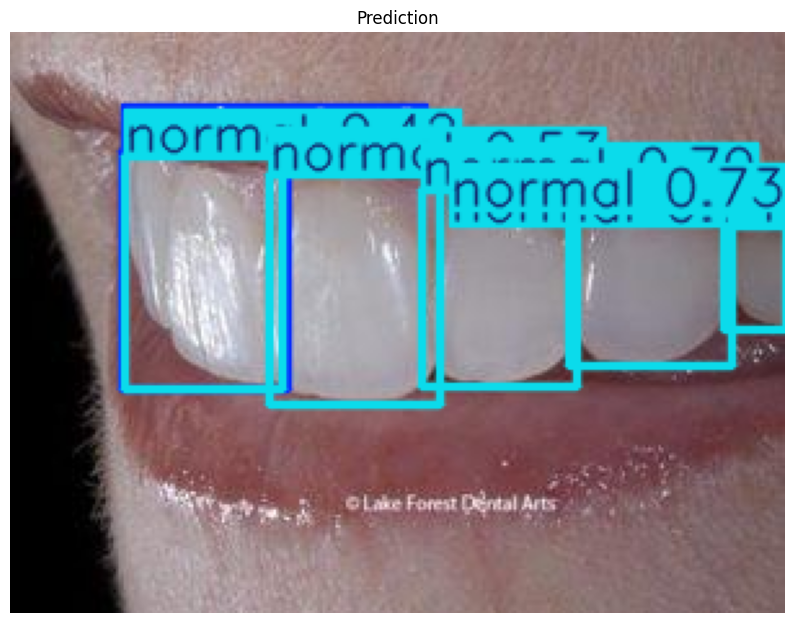

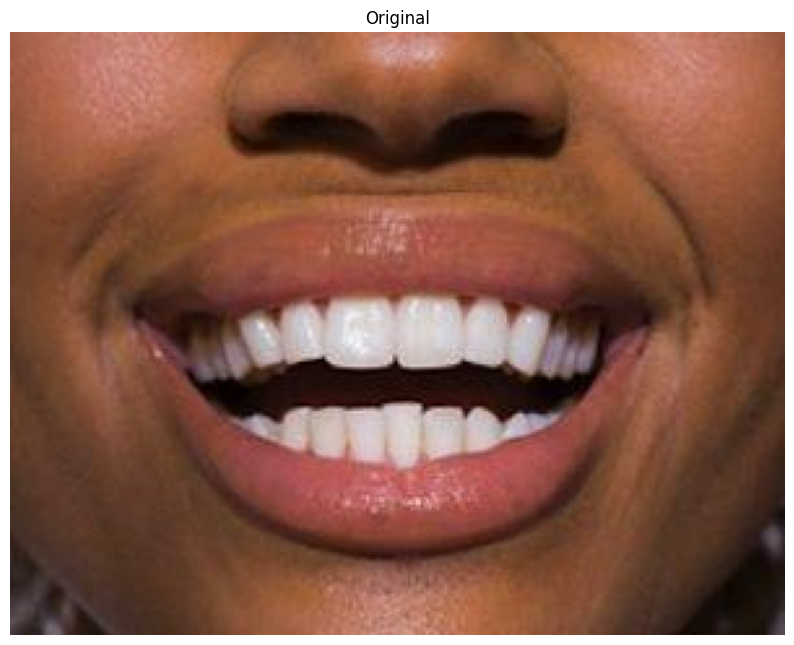


image 1/1 /content/cavity-4/test/images/healthy_teeth_380_jpg.rf.7ec9569e50567818e4d3fa9690ce54c6.jpg: 800x1024 23 normals, 27.9ms
Speed: 5.6ms preprocess, 27.9ms inference, 1.7ms postprocess per image at shape (1, 3, 800, 1024)
Results saved to /content/runs/detect/predict


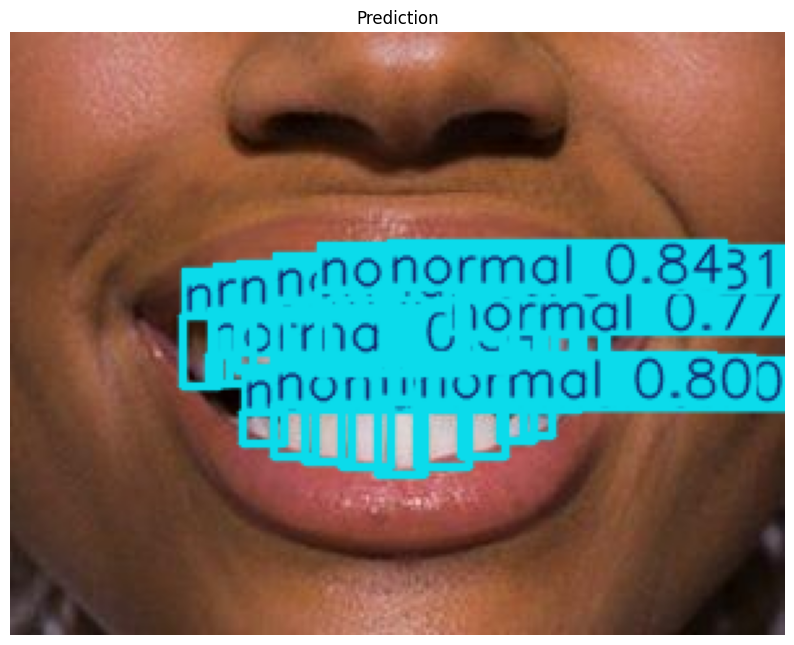

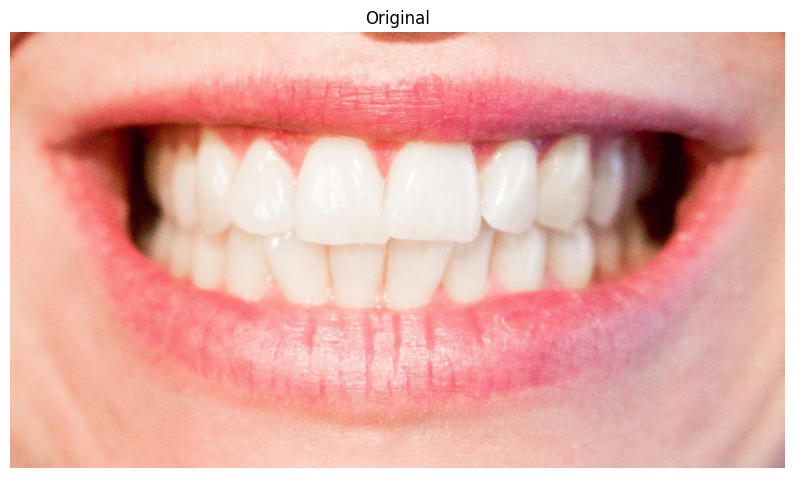


image 1/1 /content/cavity-4/test/images/healthy_teeth_352_jpg.rf.de6d172ae3547746dc3cff6464697674.jpg: 576x1024 22 normals, 20.6ms
Speed: 7.9ms preprocess, 20.6ms inference, 1.6ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to /content/runs/detect/predict


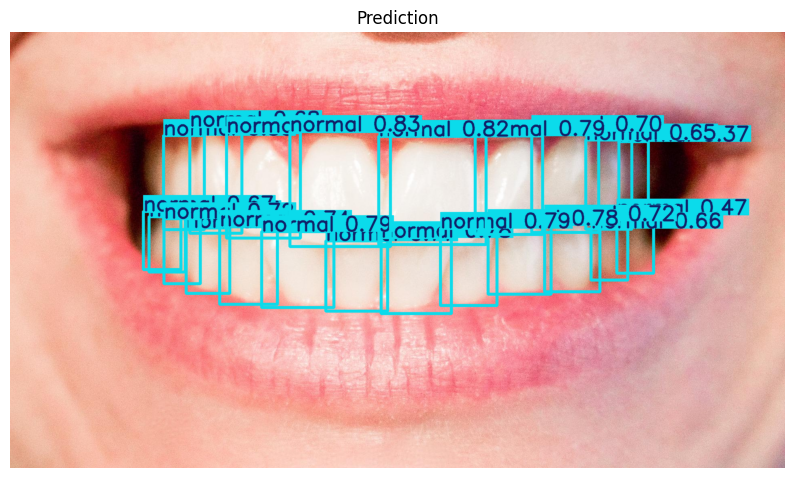

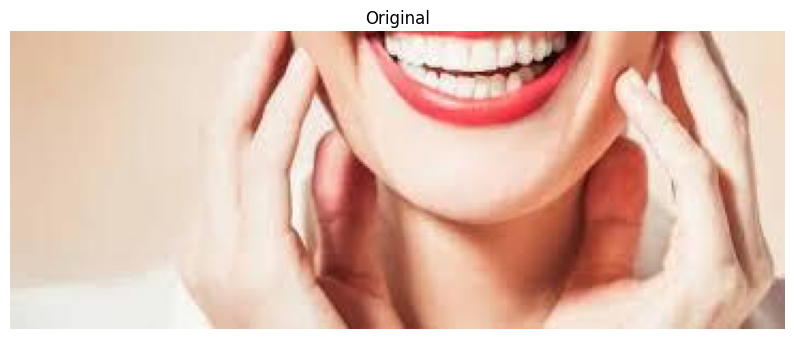


image 1/1 /content/cavity-4/test/images/healthy_teeth_378_jpg.rf.b353e16dc2a9efa28b2a5227be007d98.jpg: 416x1024 10 normals, 17.7ms
Speed: 3.3ms preprocess, 17.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 1024)
Results saved to /content/runs/detect/predict


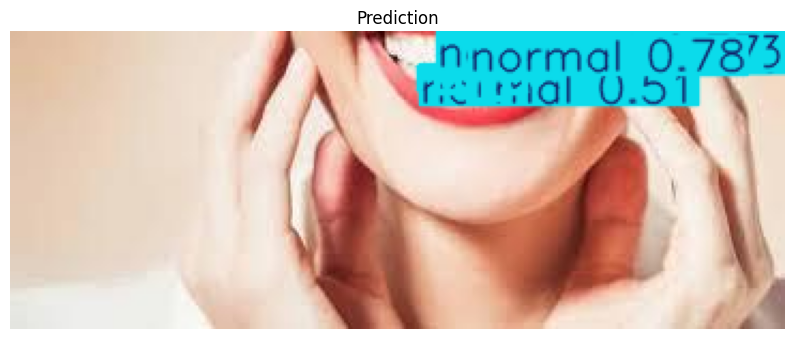

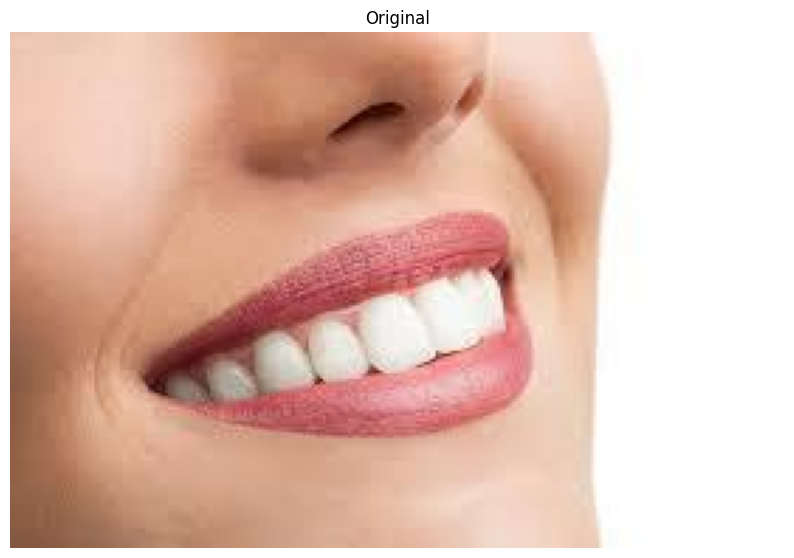


image 1/1 /content/cavity-4/test/images/healthy_teeth_347_jpg.rf.0725c5d106227b780d7c3a49169aa5ee.jpg: 704x1024 10 normals, 26.5ms
Speed: 5.6ms preprocess, 26.5ms inference, 1.7ms postprocess per image at shape (1, 3, 704, 1024)
Results saved to /content/runs/detect/predict


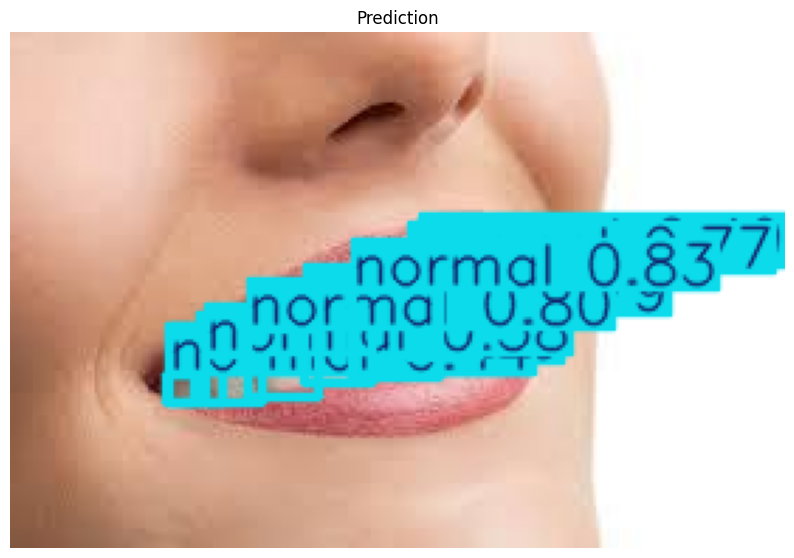

In [11]:
# Run inference on test images and visualize predictions with bounding boxes
import glob
import cv2
import matplotlib.pyplot as plt

# Load few test images
test_imgs = glob.glob("/content/cavity-4/test/images/*")[:10]

print("Found test images:", len(test_imgs))

for img in test_imgs:
    # plot original image
    orig_img = cv2.imread(img)
    orig_rgb = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 8))
    plt.imshow(orig_rgb)
    plt.axis("off")
    plt.title("Original")
    plt.show()

    # Run prediction
    pred = model.predict(source=img, conf=0.30, save=True)

    # Convert prediction tensor to plotted image
    predicted_image = pred[0].plot()

    # Convert BGR → RGB for matplotlib
    img_rgb = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)

    # Display
    plt.figure(figsize=(10, 8))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title("Prediction")
    plt.show()


plot the original images

In [10]:
from google.colab import files

files.download("/content/runs/detect/train/results.csv")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>